 The Rain in Australia dataset contains about 10 years of daily weather observations from Australian weather stations.
 the task is creating a fully-automated system that can use today's weather data for a given location to predict whether it will rain at the location tomorrow

In [1]:
import pandas as pd 
import numpy as np
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 

Data_set = pd.read_csv('Data/weatherAUS.csv')
Data_set.head(5)


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [2]:
# data set diamention 
Data_set.shape

(145460, 23)

In [3]:
# summery about Data set 
Data_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [4]:

Data_set.dropna(subset=['RainToday','RainTomorrow'],inplace=True)

In [5]:
# finding categorical colunms 
categorical = [var for var in Data_set.columns if Data_set[var].dtype=='O']
categorical

['Date',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

* There are 6 categorical variables. These are given by Location, WindGustDir, WindDir9am, WindDir3pm, RainToday and RainTomorrow
* RainTomorrow is the target variable 

In [6]:
Data_set.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [7]:
#finding missing value 
Data_set.isna().sum()

Date                 0
Location             0
MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustDir       9163
WindGustSpeed     9105
WindDir9am        9660
WindDir3pm        3670
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
RainToday            0
RainTomorrow         0
dtype: int64

In [8]:
#finding categorical values 
cat1 = [var for var in categorical if Data_set[var].isna().sum() !=0]
Data_set[cat1].isna().sum()

WindGustDir    9163
WindDir9am     9660
WindDir3pm     3670
dtype: int64

In [9]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10,6)

In [10]:
px.histogram(Data_set,x='Location',
             title= 'Location vs rainy',
             color="RainToday")

In [11]:
px.histogram(Data_set,
             x='Temp3pm',
             color='RainTomorrow',
             title='Temparature a 3pm and rain tomorrow ')

 temperature is lower the chances of rain fall is higher 

In [12]:
px.histogram(Data_set,
             x='Temp9am',
             color='RainTomorrow',
             title='Temparature a 9am and rain tomorrow ')

  temperature is lower the chances of rain fall is higher 

In [13]:
px.histogram(Data_set,
             x='RainToday',
             color='RainTomorrow',
             title='Temparature a 9am and rain tomorrow ')

In [14]:
px.scatter(Data_set.sample(2500),
           x='Temp3pm',
           y='Humidity3pm',
           color='RainTomorrow')

Training,Validation and Test sets

Training set = used to train the model compute the loss and adjust the model weight using an optimization technique 

validation set = used to evaluate the model during training,tune model hyperparameters(optimization technique,regularization etc,) and pick the best version of the model 

Test set  = used to compare diffrent model or approch and report the model final accuracy 

In [15]:
from sklearn.model_selection import train_test_split

train_value,test_value = train_test_split(Data_set,train_size=0.2,random_state=42)
train_df,val_df = train_test_split(train_value,test_size=0.25,random_state=42)

Working with dates it better idea to seprate the trainin ,validation , and test set with time so that the model is trained on past dates data and EVALUATION data fram the future 

here the dates column in the dataset to create another column for year. i picked the last two years for test set, and one year before it for the validation 

<Axes: title={'center': 'No of Row Per year'}, xlabel='Date', ylabel='count'>

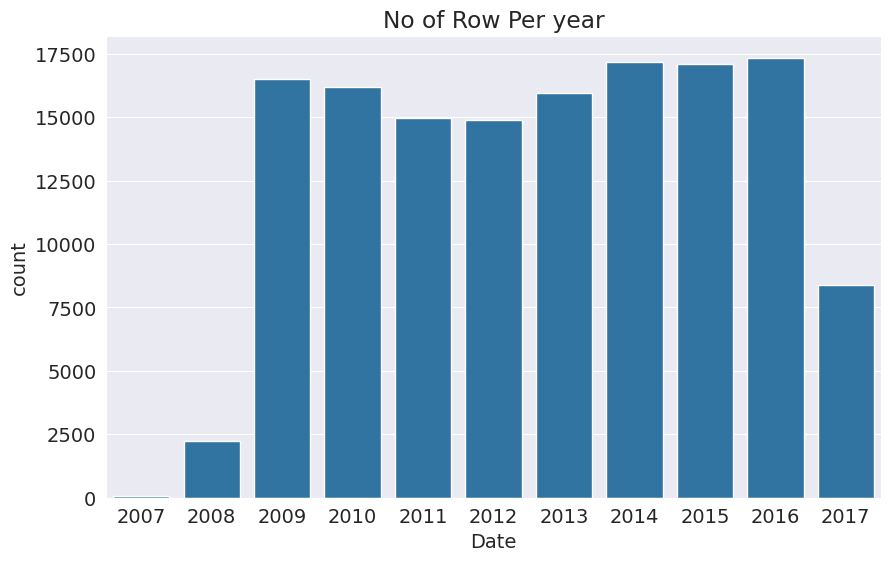

In [16]:
plt.title('No of Row Per year')
sns.countplot(x=pd.to_datetime(Data_set.Date).dt.year)

In [17]:
year = pd.to_datetime(Data_set.Date).dt.year

train_df = Data_set[year<2015]
val_df = Data_set[year == 2015]
test_df = Data_set[year > 2015]

In [18]:
print('Train Datafram shape',len(train_df))
print('valuation Datafram shape',len(train_df))
print('Test Datafram shape',len(train_df))

Train Datafram shape 97988
valuation Datafram shape 97988
Test Datafram shape 97988


In [19]:
input_data = list(train_df.columns)[1:-1]
target_colum = "RainTomorrow"

In [20]:
train_inputs = train_df[input_data].copy()
train_targets = train_df[target_colum].copy()

In [21]:
val_inputs = val_df[input_data].copy()
val_targets = val_df[target_colum].copy()

In [22]:
test_inputs = test_df[input_data].copy()
test_targets = test_df[target_colum].copy()

# numerical columns 

In [23]:
numerical_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
numerical_cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

# categorical columns 

In [24]:
categorical_colum = train_inputs.select_dtypes('object').columns.tolist()
categorical

['Date',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [25]:
train_inputs[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000,97392.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126,21.540138
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586,6.831612
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000,20.900000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.200000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000


In [26]:
train_inputs[categorical_colum].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [27]:
# handling missing value (imputation)

In [48]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy = 'mean')
imputer.fit(Data_set[numerical_cols])

SimpleImputer()

In [49]:
train_inputs[numerical_cols] = imputer.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols] = imputer.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols] = imputer.transform(test_inputs[numerical_cols])

missing values in the training, test and validation sets can now be filled by mean

In [31]:
train_inputs[numerical_cols].isna().sum()

MinTemp          31246
MaxTemp          31246
Rainfall         31246
Evaporation      31246
Sunshine         31246
WindGustSpeed    31246
WindSpeed9am     31246
WindSpeed3pm     31246
Humidity9am      31246
Humidity3pm      31246
Pressure9am      31246
Pressure3pm      31246
Cloud9am         31246
Cloud3pm         31246
Temp9am          31246
Temp3pm          31246
dtype: int64

scaling numerical features

In [50]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(Data_set[numerical_cols])

MinMaxScaler()

In [51]:
train_inputs[numerical_cols] = scaler.fit_transform(train_inputs[numerical_cols])
val_inputs[numerical_cols] = scaler.fit_transform(val_inputs[numerical_cols])
test_inputs[numerical_cols] = scaler.fit_transform(test_inputs[numerical_cols])

In [52]:
train_inputs[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,0.347855,0.333168,0.320851,0.326887,0.366057,0.323379,0.327110,0.327213,0.325705,0.325775,0.319257,0.319269,0.393597,0.403303,0.338651,0.335200
std,0.446276,0.456275,0.464734,0.460579,0.434032,0.462964,0.460429,0.460349,0.461373,0.461327,0.465783,0.465774,0.416213,0.409684,0.452535,0.454886
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.042329,0.020990,0.002065,0.011833,0.069480,0.006636,0.012059,0.012135,0.009925,0.010004,0.000559,0.000577,0.107896,0.122539,0.028947,0.023978
50%,0.042395,0.020992,0.002773,0.011905,0.069733,0.006636,0.012136,0.012182,0.010003,0.010047,0.000561,0.000579,0.108529,0.123077,0.029032,0.023985
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [55]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore')
encoder.fit(Data_set[categorical_colum])

OneHotEncoder(handle_unknown='ignore')

In [56]:
encoder.categories_

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 ar

In [59]:
encoded_cols = list(encoder.get_feature_names_out(categorical_colum))
print(encoded_cols)

['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

In [61]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_colum])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_colum])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_colum])

ValueError: Columns must be same length as key

In [62]:
print(train_inputs.head())
print(val_inputs.head())
print(test_inputs.head())


  Location   MinTemp   MaxTemp  Rainfall  Evaporation  Sunshine WindGustDir  \
0   Albury  0.045272  0.020889  0.000688     0.011905  0.069733           W   
1   Albury  0.032869  0.022705  0.000000     0.011905  0.069733         WNW   
2   Albury  0.044239  0.023201  0.000000     0.011905  0.069733         WSW   
3   Albury  0.036590  0.025100  0.000000     0.011905  0.069733          NE   
4   Albury  0.053748  0.028650  0.001147     0.011905  0.069733           W   

   WindGustSpeed WindDir9am WindDir3pm  ...  WindSpeed3pm  Humidity9am  \
0       0.007370          W        WNW  ...      0.015520     0.010273   
1       0.007370        NNW        WSW  ...      0.014227     0.006311   
2       0.007758          W        WSW  ...      0.016813     0.005430   
3       0.003491         SE          E  ...      0.005820     0.006457   
4       0.006788        ENE         NW  ...      0.012933     0.011888   

   Humidity3pm  Pressure9am  Pressure3pm  Cloud9am  Cloud3pm   Temp9am  \
0     